<a href="https://colab.research.google.com/github/wagnerscerqueira/analise_airbnb_florenca/blob/main/Analisando_os_Dados_do_Airbnb_Florenca.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a href="https://sigmoidal.ai">
  <img alt="Data Science na Prática 3.0" width="15%" src="https://raw.githubusercontent.com/carlosfab/escola-data-science/master/img/novo_logo_bg_claro.png">
</a>

# **Análise dos Dados do Airbnb - Florença**
*Wagner Cerqueira*

---

O Airbnb já é considerado a **maior empresa hoteleira da atualidade**. E o detalhe é que ele **não possui nenhum hotel!**

Conectando pessoas que querem viajar (e se hospedar) a anfitriões que querem alugar seus imóveis de maneira prática, o Airbnb fornece uma plataforma inovadora para criar essa hospedagem alternativa.

No final de 2021, o Airbnb, fundado em 2008, já havia hospedado **mais de 1 bilhão** de pessoas ao redor de todo o mundo, desafiando as redes hoteleiras tradicionais.

Uma das iniciativas do Airbnb é disponibilizar dados da plataforma para algumas das principais cidades do mundo. Por meio do portal [Inside Airbnb](http://insideairbnb.com), é possível baixar uma grande quantidade de dados para desenvolver projetos e soluções de *Data Science*.
<br><br>
<center>
  <a href="https://www.airbnb.com.br/">
    <img alt="Site do Airbnb" width="20%" src="https://raw.githubusercontent.com/wagnerscerqueira/data-science/main/Airbnb-Logo.jpg">
  </a>
</center>

## **Objetivo**

Neste projeto, serão analisados os dados referentes à cidade de Florença, na Itália, a fim de verificar quais *insights* podem ser extraídos a partir de dados brutos, considerando a seguinte situação hipotética:

Uma pessoa está planejando sua viagem de férias e gostaria de passar tanto tempo quanto possível em Florença. Em quais imóveis essa pessoa poderia se hospedar por até 30 dias? Qual a média de preço na cidade? Qual distrito é o mais caro, qual o mais barato?

Apesar de se tratar de uma análise superficial, será possível ver a quantidade de informações que podem ser tiradas dos dados.

## **Sobre a cidade**

[**Florença**](https://en.wikipedia.org/wiki/Florence) é uma cidade no centro-norte da Itália e a capital da região da Toscana. É a cidade mais populosa da Toscana, com 366 mil habitantes, e distante cerca de 270 km de Roma.

Florença era um centro de comércio e finanças da Europa medieval e uma das cidades mais ricas daquela época. É considerada por muitos acadêmicos o berço do Renascimento, tornando-se um importante centro artístico, cultural, comercial, político, econômico e financeiro. Durante este tempo, Florença alcançou uma posição de enorme influência na Itália, Europa e além. Sua turbulenta história política inclui períodos de governo da poderosa família Médici e numerosas revoluções religiosas e republicanas. De 1865 a 1871 a cidade serviu como capital do Reino da Itália (estabelecido em 1861). O dialeto florentino forma a base do italiano padrão e tornou-se a língua da cultura em toda a Itália devido ao prestígio das obras-primas de **Dante Alighieri**, **Petrarca**, **Giovanni Boccaccio**, **Nicolau Maquiavel** e **Francesco Guicciardini**.



A cidade atrai milhões de turistas todos os anos, e a UNESCO declarou o Centro Histórico de Florença Patrimônio da Humanidade em 1982. A cidade é conhecida por sua cultura, arte renascentista e arquitetura e monumentos. A cidade também contém inúmeros museus e galerias de arte, feito a Galeria Uffizi e o Palácio Pitti, e ainda exerce influência nos campos da arte, cultura e política. Devido à herança artística e arquitetônica de Florença, a Forbes a classificou a cidade mais bonita do mundo.

Florença desempenha um papel importante na moda italiana e está classificada entre as 15 principais capitais da moda do mundo pelo Global Language Monitor; além disso, é um importante centro econômico nacional, e também um centro turístico e industrial.

<center><img alt="Florença, Itália" width="50%" src="https://raw.githubusercontent.com/wagnerscerqueira/data-science/main/Florence-Tuscany.jpg"></center>

## **Obtenção dos Dados**

Todos os dados usados foram obtidos a partir do site [Inside Airbnb](http://insideairbnb.com/get-the-data.html). Neste site é possível encontrar diversos arquivos sobre várias cidades ao redor do mundo. Para esta análise exploratória inicial, será baixado apenas o seguinte arquivo:

* `listings.csv` - *Summary information and metrics for listings in Florence (good for visualisations).*

Para análises mais detalhadas, o arquivo `listings.csv.gz` contém 74 variáveis para cada um dos imóveis anunciados e deve ser utilizado.

Os dados analisados abaixo foram compilados em 17/12/2021. Pela política de dados do Inside Airbnb, apenas os dados dos últimos 12 meses serão disponibilizados para consulta livre, de modo que, com o tempo, o [conjunto de dados](http://data.insideairbnb.com/italy/toscana/florence/2021-12-17/visualisations/listings.csv) exato utilizado nesse projeto não estará mais disponível, inviabilizando o código e a análise.

Portanto, uma cópia do conjunto está armazenada [aqui](https://bit.ly/3IN1BD3) para possibilitar consultas futuras.


In [ ]:
# importar os pacotes necessarios
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium

%matplotlib inline

# importar o arquivo listings.csv para um DataFrame
df = pd.read_csv('https://bit.ly/3IN1BD3')

## **Análise Exploratória**

Esta etapa tem por objetivo criar uma consciência situacional inicial e permitir um entendimento da forma com que os dados estão estruturados. Para isso, será verificada a aparência do *dataset* a partir das 5 primeiras entradas.

In [ ]:
# mostrar as 5 primeiras entradas
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,24469,Fortezza/City Centre Modern Apt 2+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78210,11.24392,Entire home/apt,70,2,1,2019-09-27,0.04,4,361,0,NaN
1,24470,Fortezza/City Centre Modern Apt 2+1,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78202,11.24399,Entire home/apt,70,2,3,2019-04-21,0.02,4,107,0,NaN
2,24471,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78202,11.24399,Entire home/apt,135,2,0,NaN,NaN,4,107,0,NaN
3,24472,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78202,11.24399,Entire home/apt,120,2,2,2012-04-11,0.02,4,361,0,NaN
4,26738,N4U Guest House Florence,113883,N4U Guest House,NaN,Centro Storico,43.77017,11.25754,Private room,139,1,31,2019-07-03,0.22,2,347,0,NaN


A seguir está o **dicionário das variáveis** presentes no conjunto de dados importado:

* `id` - número gerado para identificar o imóvel
* `name` - nome da propriedade anunciada
* `host_id` - número de identificação do proprietário (anfitrião) do imóvel
* `host_name` - nome do anfitrião
* `neighbourhood_group` - esta variável não contém nenhum valor válido, conforme será mostrado abaixo
* `neighbourhood` - nome do distrito
* `latitude` - coordenada da latitude da propriedade
* `longitude` - coordenada da longitude da propriedade
* `room_type` - tipo de quarto oferecido (Espaço Inteiro, Quarto Inteiro, Quarto de Hotel ou Quarto Compartilhado)
* `price` - preço da diária, em euros
* `minimum_nights` - quantidade mínima de noites para reservar
* `number_of_reviews` - número de avaliações que a propriedade possui
* `last_review` - data da última avaliação
* `reviews_per_month` - média de avaliações por mês
* `calculated_host_listings_count` - quantidade de imóveis do mesmo anfitrião
* `availability_365` - número de dias disponíveis para reserva nos próximos 365 dias
* `number_of_reviews_ltm` - número de avaliações nos últimos 12 meses
* `license` - número de registro ou licença do imóvel

Para os propósitos desse projeto, as principais variáveis são `price`, `minimum_nights` e `availability_365`; `neighbourhood` e `room_type` são as variáveis secundárias.

### **Quantidade de variáveis e entradas e tipos das variáveis**

Para trabalhar com os dados, é preciso saber o tamanho do *dataset* e o tipo de cada variável. Essa etapa é importante para garantir que os dados possam ser trabalhados da maneira adequada, especialmente variáveis numéricas e de datas, e também para ter conhecimento do volume de dados a ser processados.

In [ ]:
# identificar o volume de dados do DataFrame
print('Entradas:\t{}'.format(df.shape[0]))
print('Variáveis:\t{}\n'.format(df.shape[1]))

# verificar os tipos das variáveis do dataset
display(df.dtypes)

Entradas:	10268
Variáveis:	18



id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
license                            object
dtype: object

Para o nosso conjunto de dados, existem 10.268 imóveis e 18 variáveis associadas a cada um.

### **Valores ausentes**

Não basta saber o volume e o tipo de dados, mas também quantos desses dados são válidos, isto é, não têm valores ausentes (*missing data*). A proporção de valores ausentes e a relevância de cada variável para o trabalho em questão determinam o tratamento que será feito com esses dados. Para isso, é preciso primeiro identificá-los. 

Abaixo estão as variáveis e a respectiva proporção de valores ausentes, em porcentagem, em ordem decrescente:

In [ ]:
# ordenar em ordem decrescente as variáveis por seus valores ausentes, em %
display(round(df.isnull().sum() / df.shape[0] * 100, 2).sort_values(ascending=False))


neighbourhood_group               100.00
license                            94.06
reviews_per_month                  17.94
last_review                        17.94
name                                0.02
minimum_nights                      0.00
number_of_reviews_ltm               0.00
availability_365                    0.00
calculated_host_listings_count      0.00
number_of_reviews                   0.00
id                                  0.00
room_type                           0.00
longitude                           0.00
latitude                            0.00
neighbourhood                       0.00
host_name                           0.00
host_id                             0.00
price                               0.00
dtype: float64

Constata-se que a variável `neighbourhood_group` não tem nenhum valor válido, já apresentado no dicionário de variáveis, e `license` possui 94% de valores ausentes. Essas duas variáveis não trazem nenhum dado útil para os fins desse projeto e serão, portanto, descartadas em uma etapa futura.

As variáveis `last_review` e `reviews_per_month` possuem ambas 17,94% de `missing data`, o que é facilmente explicável: se uma propriedade qualquer não tiver nenhuma avaliação, o `number_of_reviews` será zero (por isso, todos os dados dessa variável são válidos); por não ter nenhuma avaliação, a última avaliação terá valor nulo (ausente), e também a média de avaliações por mês (ainda que se pudesse considerar média zero). A partir daí, pode-se inferir, sem mais análises, que o número de imóveis sem nenhuma avaliação é de 17,94% do total analisado.

Finalmente, `name` tem 0,02% de valores ausentes.

### **Distribuição das variáveis** 

Uma primeira etapa de exploração dos dados é conhecer a distribuição deles, ou seja, a uniformidade ou diversidade de seus valores. Pela visualização de um histograma, por exemplo, é possível identificar rapidamente *outliers* (dados fora da normalidade) óbvios.

Abaixo está mostrado o gráfico de distribuição de algumas variáveis. As variáveis `id`, `host_id`, `neighbourhood_group`, `latitude` e `longitude` foram desconsideradas dessa análise por não trazerem nenhuma informação útil nesse momento; `name`, `host_name`, `neighbourhood`, `room_type`, `last_review` e `license`, por serem variáveis de texto, também foram desconsideradas.

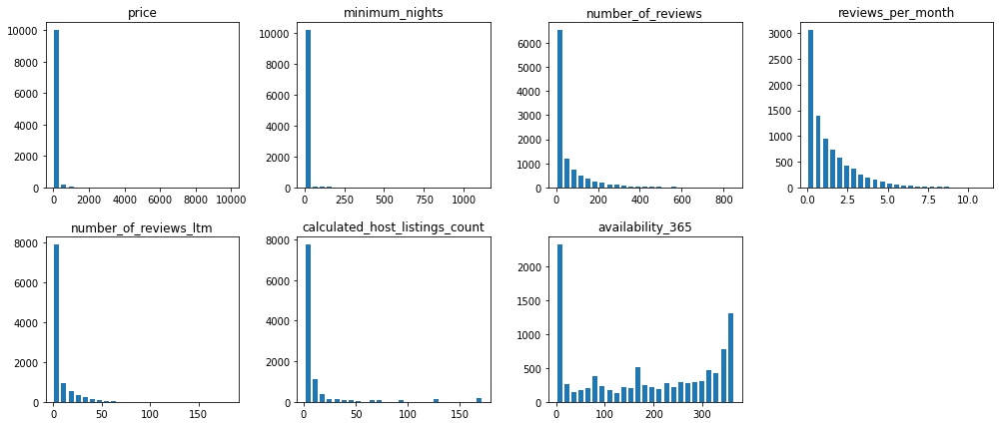

In [ ]:
# plotar o histograma das variáveis numéricas
df[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'number_of_reviews_ltm',
    'calculated_host_listings_count', 'availability_365']].hist(bins=25, figsize=(17,7), grid=False, layout=(2, 4), rwidth=0.7);

Algumas observações importantes podem ser vistas a partir desses gráficos:

* As variáveis `price` e `minimum_nights` concentram boa parte dos seus valores próximo de zero; no entanto, ainda que não se possa ver, os valores se estendem até €10 mil e reserva mínima de mil noites, respectivamente. Esses valores extremos, ainda que em pequena quantidade, distorcem os cálculos estatísticos, conforme será mostrado a seguir, e podem levar a conclusões equivocadas.

* `number_of_reviews`, `reviews_per_month` e `number_of_reviews_ltm` possuem distribuições semelhantes, já que correspondem a um mesmo aspecto, as avaliações, e possuem alta correlação (o grau de correlação entre essas três variáveis será apresentado mais à frente). Ainda que não seja comum, não é estranho que alguns imóveis tenham 800 avaliações no total ou 150 avaliações no último ano; não surpreende também que a maioria apresente poucas ou nenhuma avaliação.

* Também é esperado que quase todos os proprietários tenham somente um ou alguns imóveis anunciados; que haja proprietários com mais de cinquenta (alguns até com mais de 150!) é impressionante. É improvável - mas não impossível - que esses anfitriões sejam de fato donos de todos esses imóveis, a não ser que se tratem de vários quartos de um mesmo hotel, por exemplo. É mais provável que esses anfitriões sejam, de fato, inquilinos! É ensinado em [alguns sites](https://hospitable.com/rental-arbitrage/) da Internet uma maneira de alugar uma casa por alguns meses e em seguida disponibilizar no Airbnb, lucrando com a diferença entre o que se recebe com as reservas e o que se gasta com o aluguel convencional; é, de certa maneira, uma alavancagem, pois pode-se obter uma renda com hospedagem sem ser dono do imóvel.

* A distribuição para a disponibilidade de reserva para o próximo ano é, em certo sentido, um espelhamento dos gráficos de avaliações: os quartos tendem a se concentrar próximos de 365 (ou seja, disponibilidade total) e à medida que vão sendo reservados, os melhores com frequência maior, espalham-se ao longo do eixo. A ressalva fica exatamente no ponto zero: é razoável que mais de duas mil propriedades estejam completamente reservadas para o próximo ano, ainda mais considerando que esse é o terceiro ano de uma pandemia global, cujo fim não é esperado tão cedo? A chance maior é que os anfitriões tenham bloqueado a possibilidade de reserva, por qualquer motivo que seja (incluindo, é claro, a pandemia). Poderia-se investigar as características comuns desses imóveis, se houver, para buscar maiores informações a esse respeito; no entanto, não é o foco desse trabalho.

Agora que os *outliers* foram identificados qualitativamente, serão medidos quantitativamente.

### **Outliers**

Valores extremos, muito fora do esperado, atrapalham as análises e levam a conclusões equivocadas. Mas, estatisticamente, quais os seus efeitos?

Abaixo estão alguns dados estatísticos das variáveis observadas acima. Em ordem: 
* **quantidade** de entradas; 
* **média**; 
* **desvio padrão**; 
* valor **mínimo** encontrado; 
* valor do ponto no **primeiro quartil** (25% dos valores se encontram abaixo e 75% acima); 
* **mediana**; 
* valor do **terceiro quartil**; 
* valor **máximo**.

In [ ]:
# ver o resumo estatístico das variáveis numéricas
df[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'number_of_reviews_ltm',
    'calculated_host_listings_count', 'availability_365']].describe()

,price,minimum_nights,number_of_reviews,reviews_per_month,number_of_reviews_ltm,calculated_host_listings_count,availability_365
count,10268.000000,10268.000000,10268.000000,8426.000000,10268.000000,10268.000000,10268.000000
mean,123.433093,4.418972,52.487826,1.307718,5.790612,11.442540,181.939521
std,327.243201,27.853611,85.455781,1.420227,11.199432,28.093065,136.612573
min,0.000000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000
25%,55.000000,1.000000,2.000000,0.250000,0.000000,1.000000,29.000000
50%,79.500000,2.000000,14.000000,0.810000,0.000000,2.000000,183.000000
75%,119.000000,3.000000,66.000000,1.930000,6.000000,7.000000,320.000000
max,9999.000000,1120.000000,850.000000,11.090000,184.000000,172.000000,365.000000


As médias de preço, noites mínimas de reserva e imóveis de um mesmo anfitrião são maiores que pelo menos **75% das propriedades** analisadas no *dataset* (mais de 95% nos casos de `price` e `minimum_nights`, mais precisamente), graças aos valores máximos muito altos.<br>
Para o número de avaliações totais, por mês e nos últimos 12 meses, a média se aproxima do terceiro quartil e bem distantes da mediana, também por conta de valores máximos altos, mas nem tanto.<br>
A variável `number_of_reviews_ltm` traz ainda uma particularidade, que é o fato de que mais de 50% dos imóveis não tiveram nenhuma avaliação no último ano. Duas são as explicações mais prováveis:

1.   Devido à pandemia, menos pessoas viajaram para Florença (aliás, para qualquer lugar); sem turistas, sem hóspedes, sem avaliações.
1.   Poucas pessoas avaliam os produtos e serviços que adquirem, não somente no Airbnb; pode ser, então, uma característica geral e atemporal do ser humano.

A média de `availability_365` é quase igual à mediana, mas mais pela amplitude limitada (de 0 a 365) que por ser uma distribuição comum, diferentemente das outras variáveis, cujo máximo é indeterminado. De fato, o ponto do primeiro quartil corresponde a cerca de 8% da escala, e o do terceiro quartil, 87%.

Uma outra maneira de ver essas informações graficamente é através do *diagrama de caixa*. Ele é interpretado da seguinte maneira:

<img alt="Diagrama de caixa (box plot)" width="75%" src="https://github.com/wagnerscerqueira/data-science/raw/main/Boxplot.webp">

- a linha do centro indica a *mediana*;
- os dois limites da caixa indicam o *primeiro e o terceiro quartis*, respectivamente; esse intervalo é chamado de amplitude interquartil (IQR - *Interquartile Range*);
- as duas linhas nas pontas do diagrama indicam os *limites mínimo e máximo*, que podem ser:
  - o valor mínimo e máximo dos dados analisados; ou
  - o primeiro quartil menos uma vez e meia a amplitude interquartil, e o terceiro quartil mais 1,5x IQR. Tecnicamente, o IQR pode ser multiplicado por qualquer número real; o fator de 1,5 é o mais utilizado porque ele consegue abranger mais de 99% dos dados dentro de uma distribuição normal (gaussiana) abaixo ou acima da mediana. Por esse critério, qualquer dado além desse limite é considerado um *outlier*.

Abaixo estão os diagramas de caixa das três variáveis principais: `price`, `minimum_nights` e `availability_365`:


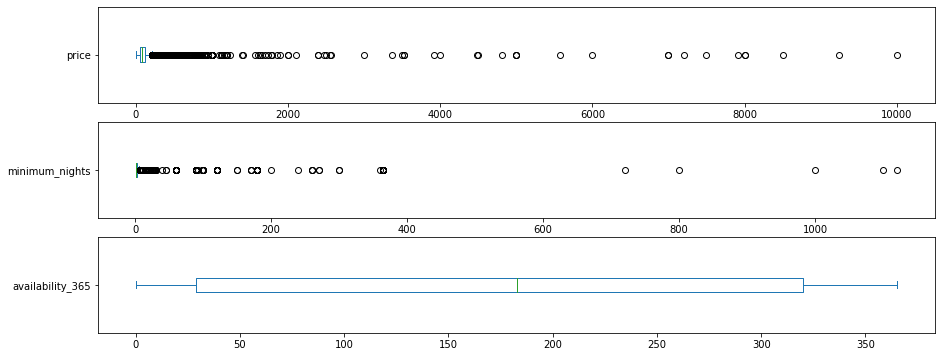

In [ ]:
# plotar diagrama de caixa de 'price', 'minimum_nights' e 'availability_365'
df.plot(subplots=True, y=['price', 'minimum_nights', 'availability_365'], 
    kind='box', vert=False, figsize=(15, 6), layout=(3,1), sharex=False);

O tamanho das caixas de preço e noites mínimas reflete a dimensão da distorção causada pelos *outliers* (`minimum_nights`, de fato, é só uma linha). O diagrama de `availability_365`, ainda que não contenha nenhum valor fora dos limites - por conta da escala restrita, já apresentada acima -, também está distorcido: a quantidade de dados dentro e fora da caixa é a mesma, 50% do total do conjunto, mas representam proporções muito diferentes da escala, 80% e 20%, respectivamente.

A quantidade e a proporção dos *outliers*, para `price` e `minimum_nights`, e de disponibilidade zero, para `availability_365`, está apresentada abaixo para demonstrar que tão poucos dados extremamente divergentes dos demais podem causar efeitos tais quais os mostrados acima. O valor de corte é o dado do terceiro quartil mais 1,5 vezes a amplitude interquartil, ou o número de zeros:

In [ ]:
# ver quantidade de valores acima de 215 para price
print("Quantidade e proporção de outliers para price:")
print("{} entradas".format(len(df[df.price > 215])))
print("{:.2f}%\n".format((len(df[df.price > 215]) / df.shape[0])*100))

# ver quantidade de valores acima de 6 dias para minimum_nights
print("Quantidade e proporção de outliers para minimum_nights:")
print("{} entradas".format(len(df[df.minimum_nights > 6])))
print("{:.2f}%\n".format((len(df[df.minimum_nights > 6]) / df.shape[0])*100))

# ver quantidade de valores iguais a 0 para availability_365
print("Quantidade e proporção de valores iguais a 0 para availability_365:")
print("{} entradas".format(len(df[df.availability_365 == 0])))
print("{:.2f}%".format((len(df[df.availability_365 == 0]) / df.shape[0])*100))

Quantidade e proporção de outliers para price:
814 entradas
7.93%

Quantidade e proporção de outliers para minimum_nights:
514 entradas
5.01%

Quantidade e proporção de valores iguais a 0 para availability_365:
1968 entradas
19.17%


Para elevar a média acima do terceiro quartil, para colocar 50% do total de dados em apenas 20% da escala, é necessário apenas 8%, 5%, 19% de valores radicalmente diferentes:

- o valor máximo de `price`, €9999, é 46,5 vezes maior que o limite máximo do diagrama de caixa, €215;
- o máximo de `minimum_nights`, 1.120 noites, equivalente a 3 anos e 25 dias, é 186,7 vezes maior que o limite, 6 noites;
- 19% dos imóveis estão concentrados em 0,27% da escala de `availability_365` (1/366).

Os *outliers* já foram detectados e medidos; o próximo passo é removê-los para adequar o *dataset* à situação trabalhada neste projeto: uma pessoa que deseja passar as férias em Florença. Serão removidos os seguintes dados:

1. imóveis cujo `minimum_nights` seja superior a 30, período máximo que a pessoa hipotética poderia ficar hospedada;
1. imóveis com disponibilidade zero, que já estão reservados por todo o próximo ano ou estão bloqueados para novas reservas;
1. imóveis com preço superior a €750, que correspondem a cerca de 1% do total; com isso, há uma diminuição considerável da distorção provocada pelos *outliers*, sem perder informação relevante nem diminuir artificialmente a média de preços dos imóveis;
1. toda a coluna `neighbourhood_group` e `license`, por não conter nenhum dado útil, conforme apresentado no início do projeto.

In [ ]:
# remover os *outliers* em um novo DataFrame para adequar à situação hipotética
df_clean = df.copy()
df_clean.drop(df_clean[df_clean.minimum_nights > 30].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.availability_365 == 0].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.price > 750].index, axis=0, inplace=True)

# remover 'neighbourhood_group' e 'license'
df_clean.drop(columns=['neighbourhood_group', 'license'], inplace=True)

Para comparação, serão mostrados abaixo os histogramas, o resumo estatístico e os diagramas de caixa, a fim de verificar a diferença antes e depois da remoção:

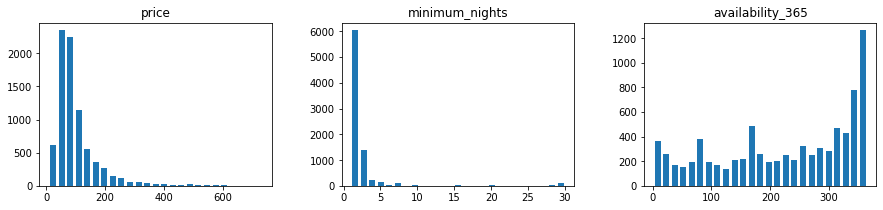

In [ ]:
# plotar o histograma de 'price', 'minimum_nights' e 'availability_365'
df_clean[['price', 'minimum_nights', 'availability_365']].hist(bins=25, figsize=(15,3), grid=False, rwidth=0.7, layout=(1,3));

A distribuição de `price`, `minimum_nights` e `availability_365` ficou muito mais coerente; pode-se ver mais claramente a concentração de preço na faixa entre €50 e €100.


In [ ]:
# ver o resumo estatístico de 'price', 'minimum_nights' e 'availability_365'
df_clean[['price', 'minimum_nights', 'availability_365']].describe()

,price,minimum_nights,availability_365
count,8147.000000,8147.000000,8147.000000
mean,102.598134,2.569044,225.146680
std,80.562556,3.763998,115.497517
min,9.000000,1.000000,1.000000
25%,57.000000,1.000000,134.000000
50%,80.000000,2.000000,250.000000
75%,118.000000,3.000000,336.000000
max,736.000000,30.000000,365.000000


O conjunto de dados reduziu em cerca de 20,6%; o desvio padrão das variáveis principais diminuiu drasticamente, o que significa que a variação dos valores nessas colunas ficou menor, e as médias convergiram para mais perto da mediana.

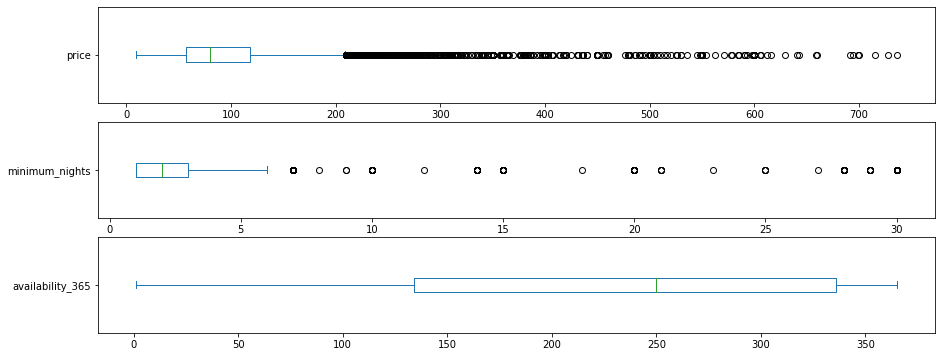

In [ ]:
# plotar diagrama de caixa de 'price', 'minimum_nights' e 'availability_365'
df_clean.plot(subplots=True, y=['price', 'minimum_nights', 'availability_365'], 
    kind='box', vert=False, figsize=(15, 6), layout=(3,1), sharex=False);

Apesar de ainda haver muitos dados fora do diagrama, as informações estão muito mais claras; onde antes havia apenas uma linha, em `price` e `minimum_nights`, agora é possíver ver a mediana e a amplitude interquartil. A distribuição de valores de `availability_365` parece fazer mais sentido, com aproximadamente metade dos dados em cada metade da escala.

Antes de proceder para a análise da situação e os *insights* que podem ser gerados, será avaliada, por último, a correlação entre as variáveis.

### **Correlação**

Chama-se [correlação](https://conceito.de/correlacao) à ligação recíproca ou correspondente que existe entre dois ou mais elementos. O conceito é usado de diferentes maneiras, de acordo com o contexto.

No campo da matemática e estatística, a correlação refere-se à proporcionalidade e à relação linear que existem entre variáveis diferentes. Se os valores de uma variável são sistematicamente modificados em relação aos valores de outra, diz-se que as duas variáveis estão correlacionadas.

Abaixo está a matriz de correlação entre as diferentes variáveis do conjunto de dados, e também o *heatmap* para facilitar a visualização dessas correlações; quanto mais escuro for o tom de azul, maior a correlação positiva; quanto mais escuro o vermelho, maior a correlação negativa, isto é, as variáveis se correlacionam inversamente (quando uma aumenta, a outra diminui). Branco indica ausência de correlação.

,price,minimum_nights,number_of_reviews,reviews_per_month,number_of_reviews_ltm,calculated_host_listings_count,availability_365
price,1.000000,-0.026828,-0.149935,-0.158273,-0.150077,0.077669,0.049307
minimum_nights,-0.026828,1.000000,-0.066420,-0.113259,-0.100105,-0.033358,-0.052186
number_of_reviews,-0.149935,-0.066420,1.000000,0.709491,0.536725,-0.120047,-0.013546
reviews_per_month,-0.158273,-0.113259,0.709491,1.000000,0.741844,-0.099940,-0.002506
number_of_reviews_ltm,-0.150077,-0.100105,0.536725,0.741844,1.000000,-0.065250,0.007990
calculated_host_listings_count,0.077669,-0.033358,-0.120047,-0.099940,-0.065250,1.000000,0.027160
availability_365,0.049307,-0.052186,-0.013546,-0.002506,0.007990,0.027160,1.000000


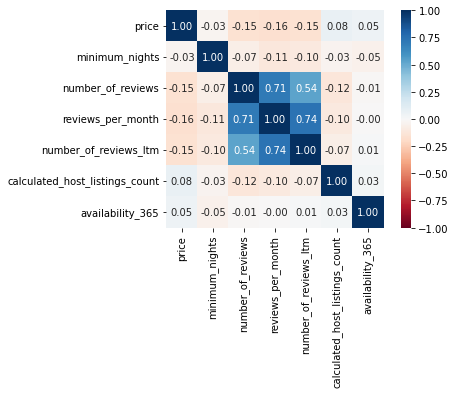

In [ ]:
# criar uma matriz de correlação
corr = df_clean[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
                 'number_of_reviews_ltm', 'calculated_host_listings_count', 'availability_365']].corr()

# mostrar a matriz de correlação
display(corr)

# plotar um heatmap a partir das correlações
sns.heatmap(corr, vmin=-1.0, vmax=1.0, cmap='RdBu', fmt='.2f', square=True, linecolor='white', annot=True);

Já antecipado, as maiores correlações são entre as variáveis associadas às avaliações; as demais variáveis têm correlação neutra ou negativa.

Chama atenção a zona levemente alaranjada em volta do centro azul, indicando que `price`, `minimum_nights` e `calculated_host_listings_count` têm baixa correlação negativa com `number_of_reviews`, `reviews_per_month` e `number_of_reviews_ltm`, variando entre -7% e -16%. A interpretação, para preço e noites mínimas para reserva, é intuitiva: quanto menor o preço e menor o período mínimo para hospedagem, mais pessoas vão querer (e poder) se hospedar naquele quarto, possibilitando maior quantidade de avaliações. No caso da quantidade de imóveis por prorpietário, a explicação não é tão intuitiva; afinal, quanto mais quartos um anfitrião tem disponíveis para reserva, mais avaliações receberá, certo? 

Sim, <ins>*para o anfitrião*</ins>, não para o quarto. O fato de um imóvel pertencer a uma pessoa que é dona de uma centena de outros imóveis não influencia em nada na quantidade de avaliações que terá, nem significa que tem mais chances de ser avaliado do que aquele que é a única propriedade de alguém. Ao contrário: um número elevado de imóveis aumenta a chance de o anfitrião ter zero avaliação em pelo menos um imóvel (já foi apresentado que 25% dos imóveis possui duas ou menos avaliações). 

A variável `calculated_host_listings_count` é uma característica do anfitrião, não do imóvel; entretanto, as entradas representam os imóveis; portanto, os imóveis que pertencem a um mesmo dono compartilham o mesmo valor para `calculated_host_listings_count`. Considerando que boa parte dos quartos tem pouca ou nenhuma avaliação e que a maioria dos anfitriões possui apenas um imóvel, é compreensível que o número de avaliações de um quarto permaneça baixo mesmo para aqueles cujos donos possuem várias propriedades. 

A correlação, conclui-se, é levemente negativa, mas *isso não implica **causalidade**!* As duas variáveis, `calculated_host_listings_count` e `number_of_reviews` (e também as demais associadas às avaliações) são independentes e não influenciam uma na outra; o indicativo de correlação negativa é apenas uma coincidência. É papel do analista saber distinguir correlação e causalidade para que a análise seja exata.

## **Análise da Situação**

Finalizadas as etapas da análise exploratória dos dados, em que foram verificados a **estrutura** do *dataset*, **volume e tipos** dos dados, quantidade de **valores ausentes**, **distribuição** dos valores das variáveis, **detecção e remoção** de *outliers* e a **correlação** entre as variáveis, pode-se proceder para a análise da situação hipotética.

Busca-se aqui a resposta para algumas perguntas que podem ser feitas por uma pessoa interessada em viajar para Florença nas suas férias: 
- Qual a média de preço para se hospedar no Airbnb?
- Qual é o distrito mais caro e qual o mais barato?
- Quais tipos de quarto são mais disponíveis e qual a diferença de preço entre eles?

### **Média de preços**

A média de preços da cidade é a expecativa de custo da hospedagem e serve de parâmetro para avaliar a diferença de preços dos distritos em relação ao restante da cidade.

In [ ]:
# ver a média de preço da cidade
city_mean_price = df_clean.price.mean()
print('Média de preços em Florença por noite: €{:.2f}'.format(city_mean_price).replace('.',','))

Média de preços em Florença por noite: €102,60


### **Distritos**

O município de Florença é subdividido em cinco distritos administrativos (*Quartieri*). Cada distrito é governado por um Conselho (*Consiglio*) e um Presidente, eleitos ao mesmo tempo que o prefeito da cidade. Os distritos têm o poder de aconselhar o prefeito com pareceres não vinculativos sobre um vasto leque de temas (meio ambiente, construção, saúde pública, mercados locais) e exercer as funções que lhes são delegadas pela Câmara Municipal; além disso, contam com um orçamento independente para financiar atividades locais. Os distritos são:

- Centro Storico;
- Campo di Marte;
- Gavinana-Galluzzo;
- Isolotto-Legnaia;
- Rifredi.

A seguir estão informações sobre a distribuição de quartos por distrito:

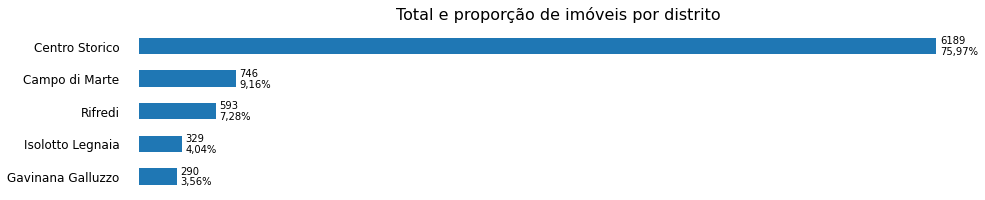

In [ ]:
# criar gráfico
ax = df_clean.neighbourhood.value_counts().sort_values(ascending=True).plot.barh(figsize=(15, 3))

# formatar gráfico
ax.set_title('Total e proporção de imóveis por distrito', loc='center', pad=10, fontdict={'fontsize': 16})
ax.set_frame_on(False)
ax.set_ylabel('')
ax.set_xlim(0, 6500)
ax.get_xaxis().set_visible(False)
ax.tick_params(axis='y', length=0, labelsize=12, pad=20)

# inserir rótulos
for rect in ax.patches:
  ax.text(rect.get_width() + 30,
          rect.get_y() + rect.get_height()*5/6,
          '{}'.format((rect.get_width())),
          va='center')
  ax.text(rect.get_width() + 30,
          rect.get_y() + rect.get_height()/6,
          '{:.2f}%'.format((rect.get_width()/df_clean.shape[0]*100)).replace('.',','),
          va='center')

Três quartos das propriedades anunciadas no Airbnb em Florença estão no Centro Histórico; essa quantidade se justifica pela proximidade dos principais pontos turísticos da cidade.

As médias de preço por distrito e a diferença para a média da cidade são as seguintes:

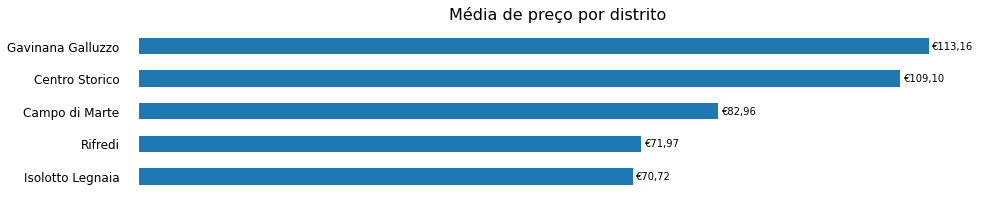

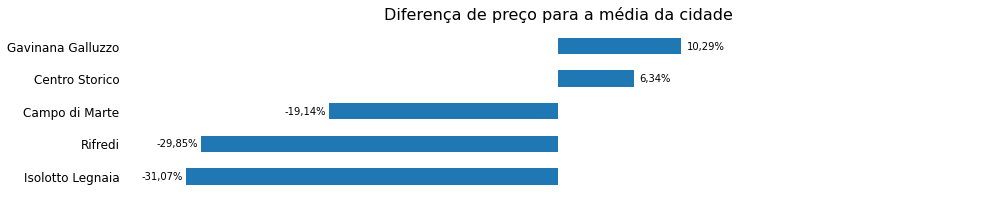

In [ ]:
# criar primeiro gráfico
ax = df_clean.groupby(['neighbourhood']).price.mean().sort_values(ascending=True).plot.barh(figsize=(15,3))

# formatar gráfico
ax.set_title('Média de preço por distrito', loc='center', pad=10, fontdict={'fontsize': 16})
ax.set_frame_on(False)
ax.set_ylabel('')
ax.set_xlim(0, 120)
ax.get_xaxis().set_visible(False)
ax.tick_params(axis='y', length=0, labelsize=12, pad=20)

# inserir rótulos
for rect in ax.patches:
  ax.text(rect.get_width() + 0.5,
          rect.get_y() + (rect.get_height() / 2),
          '€{:.2f}'.format((rect.get_width())).replace('.',','),
          va='center')

plt.show();

# criar segundo gráfico
ax = df_clean.groupby(['neighbourhood']).price.mean().sort_values(ascending=True).plot.barh(figsize=(15,3))

# formatar gráfico
ax.set_title('Diferença de preço para a média da cidade', loc='center', pad=10, fontdict={'fontsize': 16})
ax.set_frame_on(False)
ax.set_ylabel('')
ax.set_xlim(-35, 35)
ax.get_xaxis().set_visible(False)
ax.tick_params(axis='y', length=0, labelsize=12, pad=20)

# inserir rótulos
for rect in ax.patches:
  rect.set_width(rect.get_width()/city_mean_price * 100 - 100)
  if rect.get_width() > 0: 
    x = rect.get_width() + 0.5 
  else: 
    x = rect.get_width() - 3.75
  ax.text(x,
          rect.get_y() + (rect.get_height() / 2),
          '{:.2f}%'.format((rect.get_width())).replace('.',','),
          va='center')

plt.show();

O distrito de Gavinana-Galluzzo é o mais caro, custando em média €113,16; Isolotto-Legnaia é o distrito mais barato, €70,72. Chama atenção o fato de que o Centro Histórico de Florença seja somente 6,34% mais caro que a média da cidade, considerando que é nesse distrito que estão muitas das atrações turísticas, feito a Catedral de Santa Maria del Fiore, a Ponte Vecchio, a Basílica de Santa Cruz, o Palácio Pitti e diversos museus.

### **Tipos de quarto**

Além do preço, é importante saber quais tipos de hospedagem estão disponíveis, já que nem todo mundo ficaria confortável em dividir o quarto ou mesmo a sala e a cozinha com outras pessoas. Essas são as quantidades de cada tipo de quarto em Florença:

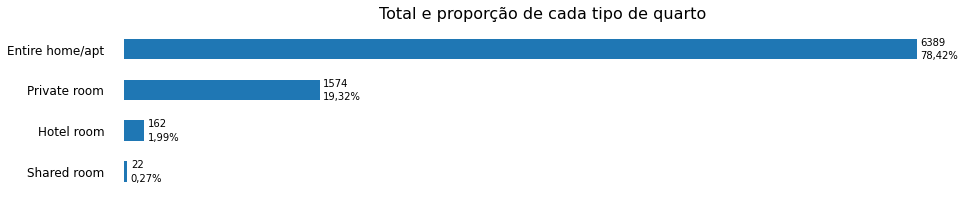

In [ ]:
# criar gráfico
ax = df_clean.room_type.value_counts().sort_values(ascending=True).plot.barh(figsize=(15, 3))

# formatar gráfico
ax.set_title('Total e proporção de cada tipo de quarto', loc='center', pad=10, fontdict={'fontsize': 16})
ax.set_frame_on(False)
ax.set_ylabel('')
ax.set_xlim(0, 6750)
ax.get_xaxis().set_visible(False)
ax.tick_params(axis='y', length=0, labelsize=12, pad=20)

# inserir rótulos
for rect in ax.patches:
  ax.text(rect.get_width() + 30,
          rect.get_y() + rect.get_height()*5/6,
          '{}'.format((rect.get_width())),
          va='center')
  ax.text(rect.get_width() + 30,
          rect.get_y() + rect.get_height()/6,
          '{:.2f}%'.format((rect.get_width()/df_clean.shape[0]*100)).replace('.',','),
          va='center')

Praticamente todos os imóveis anunciados são do tipo Espaço Inteiro ou Quarto Inteiro, cada um com um grau de privacidade diferente. As médias de preço de cada tipo são as seguintes:

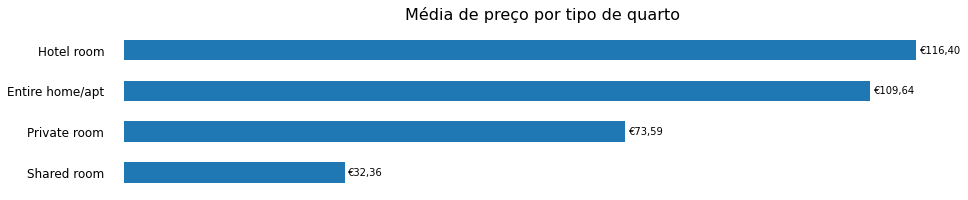

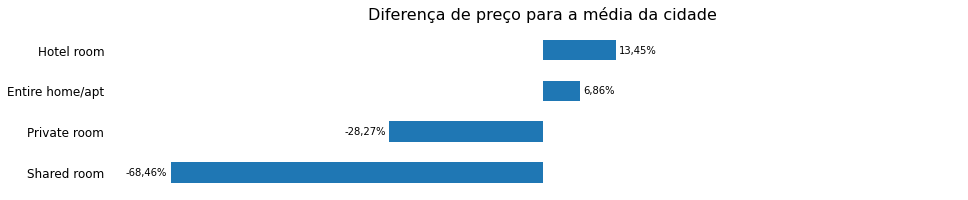

In [ ]:
# criar primeiro gráfico
ax = df_clean.groupby(['room_type']).price.mean().sort_values(ascending=True).plot.barh(figsize=(15,3))

# formatar gráfico
ax.set_title('Média de preço por tipo de quarto', loc='center', pad=10, fontdict={'fontsize': 16})
ax.set_frame_on(False)
ax.set_ylabel('')
ax.set_xlim(0, 123)
ax.get_xaxis().set_visible(False)
ax.tick_params(axis='y', length=0, labelsize=12, pad=20)

# inserir rótulos
for rect in ax.patches:
  ax.text(rect.get_width() + 0.5,
          rect.get_y() + (rect.get_height() / 2),
          '€{:.2f}'.format((rect.get_width())).replace('.',','),
          va='center')
plt.show();

# criar segundo gráfico
ax = df_clean.groupby(['room_type']).price.mean().sort_values(ascending=True).plot.barh(figsize=(15,3))

# formatar gráfico
ax.set_title('Diferença de preço para a média da cidade', loc='center', pad=10, fontdict={'fontsize': 16})
ax.set_frame_on(False)
ax.set_ylabel('')
ax.set_xlim(-77, 77)
ax.get_xaxis().set_visible(False)
ax.tick_params(axis='y', length=0, labelsize=12, pad=20)

# inserir rótulos
for rect in ax.patches:
  rect.set_width(rect.get_width()/city_mean_price * 100 - 100)
  if rect.get_width() > 0: 
    x = rect.get_width() + 0.5 
  else: 
    x = rect.get_width() - 8.25
  ax.text(x,
          rect.get_y() + (rect.get_height() / 2),
          '{:.2f}%'.format((rect.get_width())).replace('.',','),
          va='center')

plt.show();

Quartos de Hotel são 13,45% mais caros que a média da cidade. Para ter total privacidade abrindo mão de certas comodidades, pode-se hospedar em um Espaço Inteiro pagando €109,64 em média. Os maiores descontos são nos Quartos Compartilhados e Quartos Inteiros (partes da casa são compartilhadas), com 68,46% e 28,27% de desconto, respectivamente.

### **Localização dos imóveis**

Essas informações já são suficientes para auxiliar o turista que deseja conhecer Florença: média de preço da cidade e de cada distrito, número de espaços disponíveis para cada tipo de quarto e suas respectivas médias de preço. Ainda assim, facilitará muito a tomada de decisão desse turista saber exatamente onde estão os imóveis mais baratos e mais caros através de um mapa.

Abaixo está um mapa interativo com a marcação de cada imóvel anunciado. Os círculos amarelos são os quartos cujo preço está até 10% acima ou abaixo da média da cidade; os círculos verdes e vermelhos, por sua vez, são os quartos cujo preço está abaixo ou acima dessa faixa. Ao clicar nos círculos, o preço do imóvel correspondente será mostrado num *popup*.

In [ ]:
# criar mapa
m = folium.Map(location=[43.77238,11.25395], zoom_start=13, prefer_canvas=True,
               min_lat=43.726430, max_lat=43.837323, min_lon=11.159770, max_lon=11.336160, max_bounds=True)

# estrutura de dados que contém latitude, longitude e preço dos imóveis 
lat = []
lon = []
price = []
data = {'lat': lat, 'lon': lon, 'price': price}


for room in range(0, df_clean.shape[0]):

  # inserir informações dos imóveis dentro da estrutura de dados
  lat.append(df_clean.latitude.values[room])
  lon.append(df_clean.longitude.values[room])
  price.append(df_clean.price.values[room])

  # cor verde para imóveis mais baratos que 90% da média de preço da cidade
  if data['price'][room] < 0.9 * city_mean_price:
    color = '#008000' 

  # cor vermelha para imóveis mais caros que 110% da média de preço da cidade
  elif data['price'][room] > 1.1 * city_mean_price:
    color = '#FF0000' 

  # cor amarela para imóveis até 10% acima ou abaixo da média de preço da cidade
  else: 
    color = '#FFFF00'

  # adicionar imóvel no mapa
  folium.CircleMarker(
      location=[data['lat'][room], data['lon'][room]],
      radius=2,
      weight=2,
      opacity=0.8,
      color=color,
      fill_opacity=0.7,
      fill=True,
      popup=('€{}'.format(str(data['price'][room])))
      ).add_to(m)

# exibir mapa
m


Apesar de ser ligeiramente mais caro que a média da cidade, é possível encontrar diversos quartos baratos no *Centro Storico* e ser vizinho de alguns dos mais fascinantes pontos turísticos do mundo, ainda que somente por uns dias. Por concentrar a maior parte das propriedades anunciadas no Airbnb em Florença, nesse distrito há opções para todos os bolsos e gostos.

## **Conclusão**

Mesmo com uma análise simples e sem utilizar o conjunto de dados completo, foi possível tirar conclusões profundas. Entre as ações realizadas nesse projeto estão:

- importação e verificação do conjunto de dados (quantidade de entradas e variáveis e tipos das variáveis);
- quantificação de valores ausentes (*missing data*);
- distribuição das variáveis e identificação preliminar de *outliers*;
- investigação e remoção de *outliers*;
- verificação da correlação entre as variáveis;
- análise da situação hipotética, em que foram exploradas:
  - média de preço da cidade de Florença;
  - quantidade e médias de preço dos quartos por distrito;
  - quantidade e médias de preço por tipo de quarto;
  - localização dos imóveis anunciados.

A quantidade e qualidade dos *insights* podem ser consideravelmente aumentadas utilizando-se o conjunto completo, que ficará para um próximo projeto.

Obrigado pela atenção!
<br><br>

---

Acompanhe-me nas redes sociais:<br>
[LinkedIn](https://www.linkedin.com/in/wagnerscerqueira/) |
[Medium](https://medium.com/@wagnerscerqueira) | 
[Github](https://github.com/wagnerscerqueira/data-science)